In [44]:
# import block
import torch
import torch.nn as nn
import models.application.classify as classify
import h5py
from pathlib import Path

from models.application.classify import show_image

In [45]:
# path to files
# use absolute path to avoid jupyter notebook jank

CHECKPOINTS_PATH = "/Users/muang/PycharmProjects/tumour_deep_learning/src/validation_models/pancancer_classifier/pancancer_classifier_checkpoints.pt"
HDF_PATH_GTEX = "/Volumes/MuangEXT/IndProject/Histomorphological-Phenotype-Learning/datasets/GTEX/he/patches_h224_w224/hdf5_GTEX_he_combined.h5"
# HDF_PATH_TCGA = "/Volumes/MuangEXT/IndProject/Histomorphological-Phenotype-Learning/datasets/v07_10panCancer_5x/he/patches_h224_w224/hdf5_v07_10panCancer_5x_he_test.h5"
CSV_PATH_GTEX = "/Users/muang/PycharmProjects/tumour_deep_learning/data/GTEX_cohort/GTEX_he_combined_leiden_2p0__fold1.csv"
# CSV_PATH_TCGA = "/Users/muang/PycharmProjects/tumour_deep_learning/src/datasets/pancancer_WSI_representation/v07_10panCancer_5x_he_complete_os2_filtered_6cl_leiden_2p0__fold1_panC_os2_a6cl_v02_toFilter_clr_mintiles_100.csv"

GTEX_FIELD_NAMES = ('combined_samples', 'combined_slides', 'combined_tiles')
GTEX_FIELD_IMAGE = 'combined_img'
GTEX_FIELD_LEIDEN = 'leiden_2.0'
# TCGA_FIELD_NAMES = ('test_samples', 'test_slides', 'test_tiles')
# TCGA_FIELD_IMAGE = 'test_img'

CONCAT = '_'


In [46]:
# building model
from models.pan_cancer_classifier import PanCancerClassifier

pancancer_model = PanCancerClassifier(input_size=34,
                                      hidden_size=42,
                                      output_size=10)
pancancer_model.load_state_dict(torch.load(CHECKPOINTS_PATH, weights_only=True))

<All keys matched successfully>

In [47]:
# hdf file loading
GTEX_full_names_HDF5 = classify.process_hdf5_to_full_names(hdf5_path=HDF_PATH_GTEX,
                                                         hdf5_name_field=GTEX_FIELD_NAMES,
                                                         hdf5_name_concat=CONCAT)
GTEX_processed_csv_pd = classify.process_csv_to_full_names(csv_path=CSV_PATH_GTEX,
                                                  csv_name_field=GTEX_FIELD_NAMES,
                                                  csv_name_concat=CONCAT,
                                                  csv_leiden_field=GTEX_FIELD_LEIDEN)

In [48]:
GTEX_full_names_HDF5.head(5)

,original_indices,full_names
0,0,GTEX-QLQW-0826_GTEX-QLQW-0826_10_16.jpeg
1,1,GTEX-QLQW-0826_GTEX-QLQW-0826_10_17.jpeg
2,2,GTEX-QLQW-0826_GTEX-QLQW-0826_10_18.jpeg
3,3,GTEX-QLQW-0826_GTEX-QLQW-0826_11_13.jpeg
4,4,GTEX-QLQW-0826_GTEX-QLQW-0826_11_14.jpeg


In [49]:
# code for showing images
def show_images_leiden(sample_list,
                       leiden,
                       full_names_pd = GTEX_full_names_HDF5,
                       image_hdf5_path = HDF_PATH_GTEX,
                       image_field_name = GTEX_FIELD_IMAGE,
                       swap_RGB = True):
    for sl in sample_list:
        img = classify.get_image_by_name(full_name=sl,
                                   full_names_pd=full_names_pd,
                                   image_hdf5_path=image_hdf5_path,
                                   image_field_name=image_field_name)
        print(sl)
        print("leiden =", leiden)
        classify.show_image(img, swap_RGB=swap_RGB)
        print("=" * 50)

GTEX-15SHV-2026_GTEX-15SHV-2026_30_14.jpeg
leiden = 25


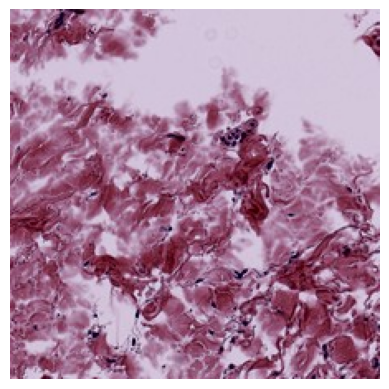

GTEX-11GSO-2426_GTEX-11GSO-2426_33_15.jpeg
leiden = 25


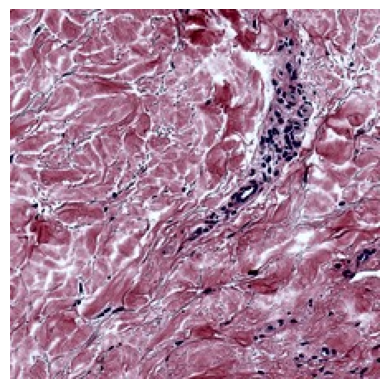

GTEX-11ZUS-0626_GTEX-11ZUS-0626_27_36.jpeg
leiden = 25


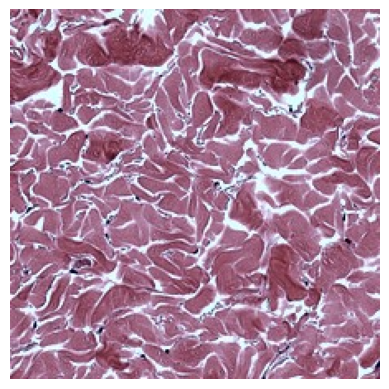

GTEX-132AR-0126_GTEX-132AR-0126_36_10.jpeg
leiden = 25


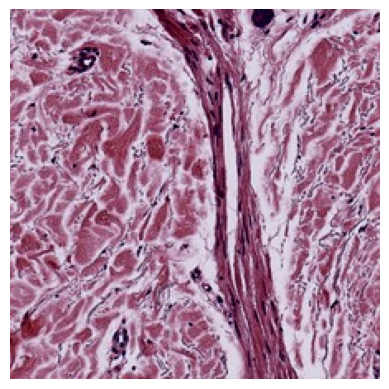

In [50]:
# BRCA from SKCM leiden 25, 1

# SKCM samples
# GTEX-15SHV-2026_GTEX-15SHV-2026_30_14.jpeg  -- 25
# GTEX-11GSO-2426_GTEX-11GSO-2426_33_15.jpeg  -- 25
# GTEX-11ZUS-0626_GTEX-11ZUS-0626_27_36.jpeg  -- 25
# GTEX-132AR-0126_GTEX-132AR-0126_36_10.jpeg  -- 25
SKCM25_samples = ["GTEX-15SHV-2026_GTEX-15SHV-2026_30_14.jpeg",
                  "GTEX-11GSO-2426_GTEX-11GSO-2426_33_15.jpeg",
                  "GTEX-11ZUS-0626_GTEX-11ZUS-0626_27_36.jpeg",
                  "GTEX-132AR-0126_GTEX-132AR-0126_36_10.jpeg"]


show_images_leiden(SKCM25_samples, 25)

GTEX-11GS4-2126_GTEX-11GS4-2126_11_12.jpeg
leiden = 25


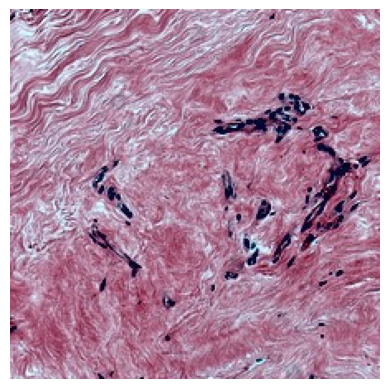

GTEX-111VG-1226_GTEX-111VG-1226_13_36.jpeg
leiden = 25


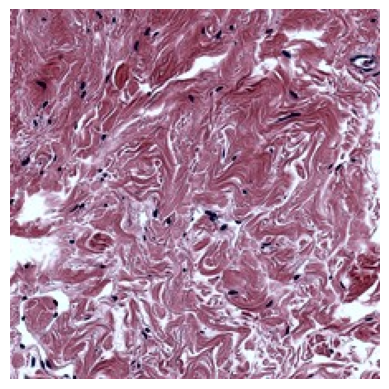

GTEX-111CU-1626_GTEX-111CU-1626_55_14.jpeg
leiden = 25


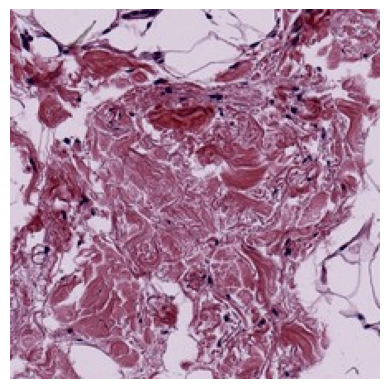

GTEX-13OVJ-2226_GTEX-13OVJ-2226_15_20.jpeg
leiden = 25


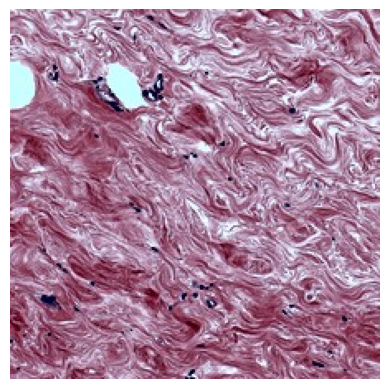

In [51]:
# BRCA samples
# GTEX-11GS4-2126_GTEX-11GS4-2126_11_12.jpeg  -- 25
# GTEX-111VG-1226_GTEX-111VG-1226_13_36.jpeg  -- 25
# GTEX-111CU-1626_GTEX-111CU-1626_55_14.jpeg  -- 25
# GTEX-13OVJ-2226_GTEX-13OVJ-2226_15_20.jpeg  -- 25
BRCA25_samples = ["GTEX-11GS4-2126_GTEX-11GS4-2126_11_12.jpeg",
                  "GTEX-111VG-1226_GTEX-111VG-1226_13_36.jpeg",
                  "GTEX-111CU-1626_GTEX-111CU-1626_55_14.jpeg",
                  "GTEX-13OVJ-2226_GTEX-13OVJ-2226_15_20.jpeg"]
show_images_leiden(BRCA25_samples, 25)


GTEX-15SHV-2026_GTEX-15SHV-2026_30_38.jpeg
leiden = 1


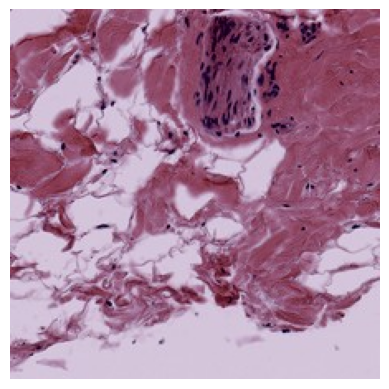

GTEX-11GSO-2426_GTEX-11GSO-2426_34_34.jpeg
leiden = 1


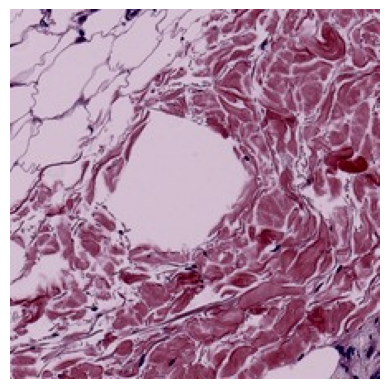

GTEX-11ZUS-0626_GTEX-11ZUS-0626_30_36.jpeg
leiden = 1


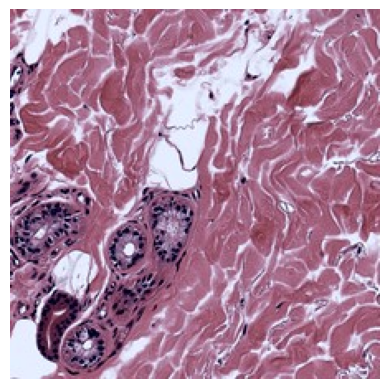

GTEX-145LU-0126_GTEX-145LU-0126_15_7.jpeg
leiden = 1


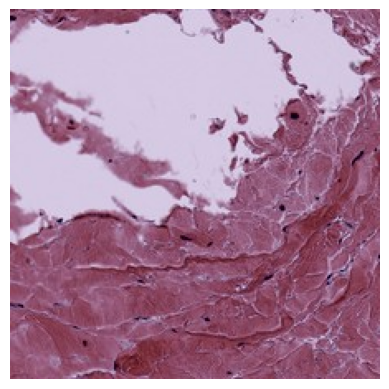

In [52]:
# SKCM samples
# GTEX-15SHV-2026_GTEX-15SHV-2026_30_38.jpeg  -- 1
# GTEX-11GSO-2426_GTEX-11GSO-2426_34_34.jpeg  -- 1
# GTEX-11ZUS-0626_GTEX-11ZUS-0626_30_36.jpeg  -- 1
# GTEX-145LU-0126_GTEX-145LU-0126_15_7.jpeg   -- 1
SKCM1_samples = ["GTEX-15SHV-2026_GTEX-15SHV-2026_30_38.jpeg",
                 "GTEX-11GSO-2426_GTEX-11GSO-2426_34_34.jpeg",
                 "GTEX-11ZUS-0626_GTEX-11ZUS-0626_30_36.jpeg",
                 "GTEX-145LU-0126_GTEX-145LU-0126_15_7.jpeg"]
show_images_leiden(SKCM1_samples, 1)

GTEX-11GS4-2126_GTEX-11GS4-2126_14_25.jpeg
leiden = 1


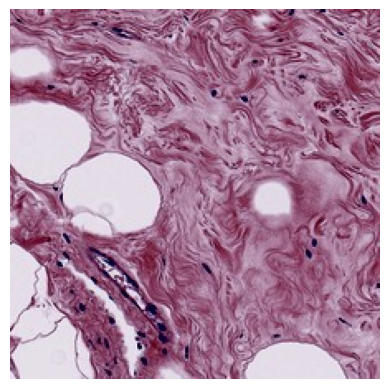

GTEX-111VG-1226_GTEX-111VG-1226_13_32.jpeg
leiden = 1


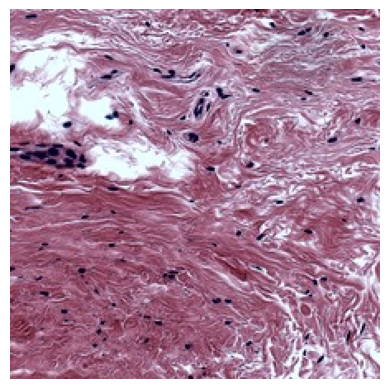

GTEX-111CU-1626_GTEX-111CU-1626_40_10.jpeg
leiden = 1


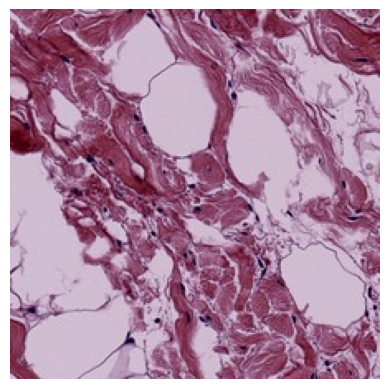

GTEX-13OVJ-2226_GTEX-13OVJ-2226_16_37.jpeg
leiden = 1


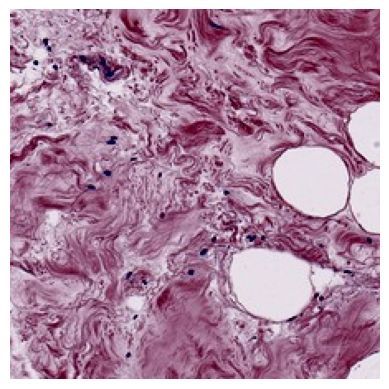

In [53]:
# GTEX-11GS4-2126_GTEX-11GS4-2126_14_25.jpeg  -- 1
# GTEX-111VG-1226_GTEX-111VG-1226_13_32.jpeg  -- 1
# GTEX-111CU-1626_GTEX-111CU-1626_40_10.jpeg  -- 1
# GTEX-13OVJ-2226_GTEX-13OVJ-2226,16_37.jpeg  -- 1
BRCA1_samples = ["GTEX-11GS4-2126_GTEX-11GS4-2126_14_25.jpeg",
                 "GTEX-111VG-1226_GTEX-111VG-1226_13_32.jpeg",
                 "GTEX-111CU-1626_GTEX-111CU-1626_40_10.jpeg",
                 "GTEX-13OVJ-2226_GTEX-13OVJ-2226_16_37.jpeg"]
show_images_leiden(BRCA1_samples, 1)

GTEX-T5JW-0726_GTEX-T5JW-0726_47_30.jpeg
leiden = 4


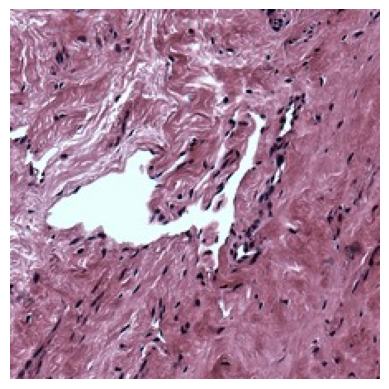

GTEX-U3ZN-1526_GTEX-U3ZN-1526_6_13.jpeg
leiden = 4


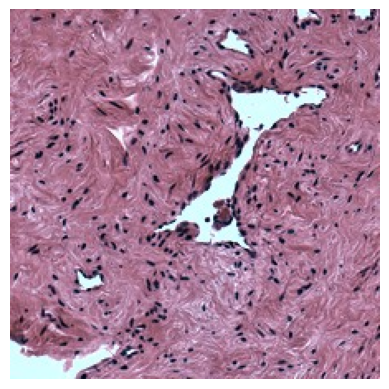

GTEX-POMQ-1526_GTEX-POMQ-1526_33_33.jpeg
leiden = 4


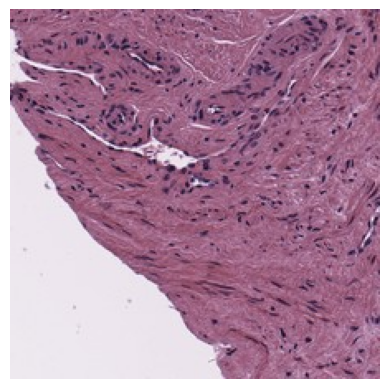

GTEX-PWCY-1626_GTEX-PWCY-1626_20_9.jpeg
leiden = 4


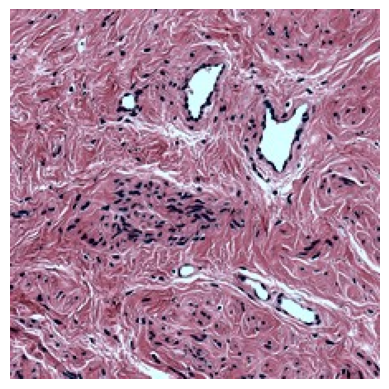

GTEX-Q734-1526_GTEX-Q734-1526_17_6.jpeg
leiden = 4


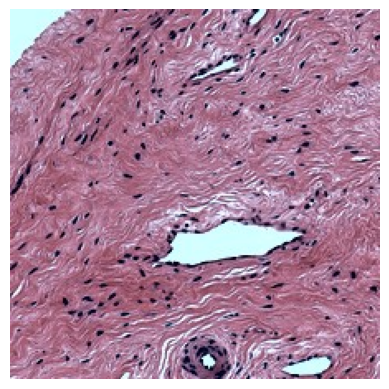

In [54]:
# CESC --> PRAD
# leiden 4, 6, 32

# CESC samples, leiden 4
CESC4 = ["GTEX-T5JW-0726_GTEX-T5JW-0726_47_30.jpeg",
         "GTEX-U3ZN-1526_GTEX-U3ZN-1526_6_13.jpeg",
         "GTEX-POMQ-1526_GTEX-POMQ-1526_33_33.jpeg",
         "GTEX-PWCY-1626_GTEX-PWCY-1626_20_9.jpeg",
         "GTEX-Q734-1526_GTEX-Q734-1526_17_6.jpeg"]
show_images_leiden(CESC4, 4)

GTEX-1399R-0526_GTEX-1399R-0526_23_29.jpeg
leiden = 4


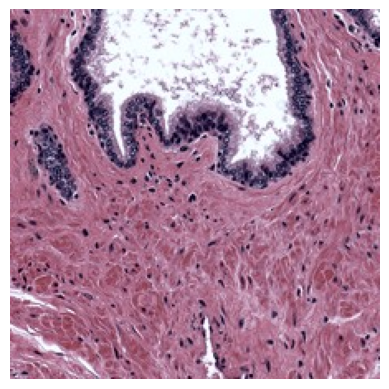

GTEX-13RTJ-2126_GTEX-13RTJ-2126_12_17.jpeg
leiden = 4


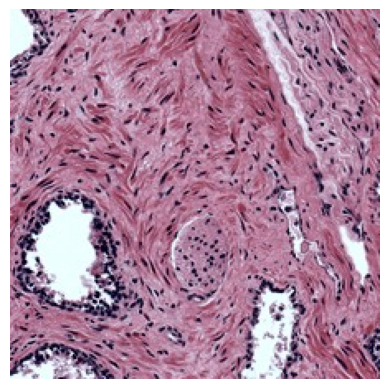

GTEX-13RTJ-2126_GTEX-13RTJ-2126_62_20.jpeg
leiden = 4


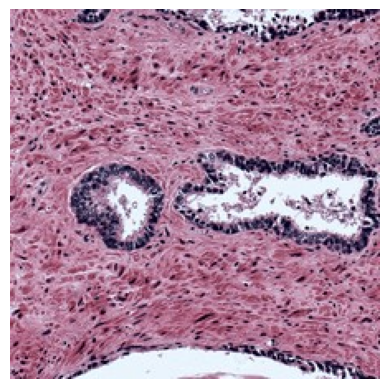

GTEX-111FC-2026_GTEX-111FC-2026_15_19.jpeg
leiden = 4


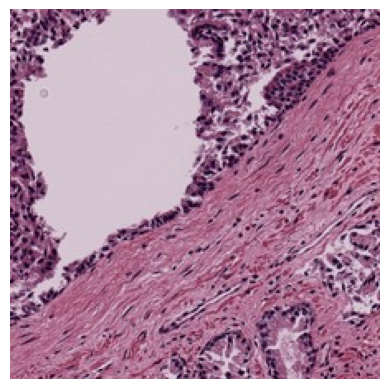

GTEX-11DXW-0926_GTEX-11DXW-0926_11_32.jpeg
leiden = 4


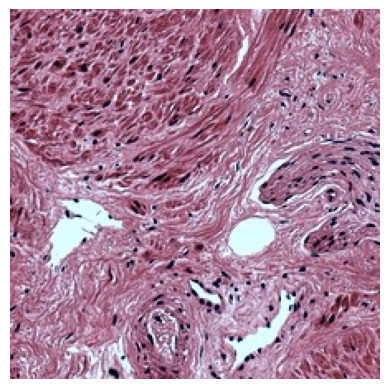

In [55]:
# PRAD samples, leiden 4
PRAD4 = ["GTEX-1399R-0526_GTEX-1399R-0526_23_29.jpeg",
         "GTEX-13RTJ-2126_GTEX-13RTJ-2126_12_17.jpeg",
         "GTEX-13RTJ-2126_GTEX-13RTJ-2126_62_20.jpeg",
         "GTEX-111FC-2026_GTEX-111FC-2026_15_19.jpeg",
         "GTEX-11DXW-0926_GTEX-11DXW-0926_11_32.jpeg"]

show_images_leiden(PRAD4, 4)

GTEX-QLQW-0826_GTEX-QLQW-0826_45_22.jpeg
leiden = 4


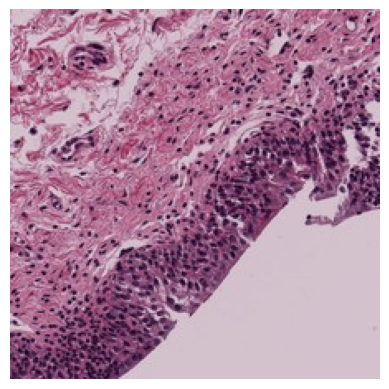

GTEX-OOBJ-1926_GTEX-OOBJ-1926_5_1.jpeg
leiden = 4


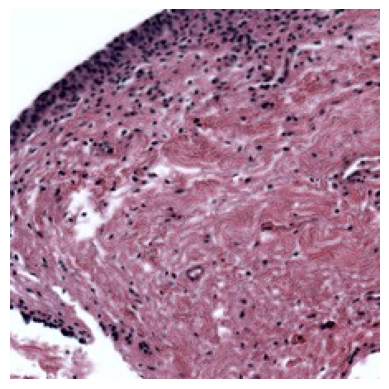

GTEX-11ZU8-1926_GTEX-11ZU8-1926_47_21.jpeg
leiden = 4


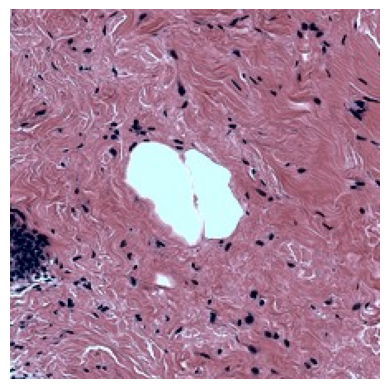

GTEX-13OVJ-2226_GTEX-13OVJ-2226_23_25.jpeg
leiden = 4


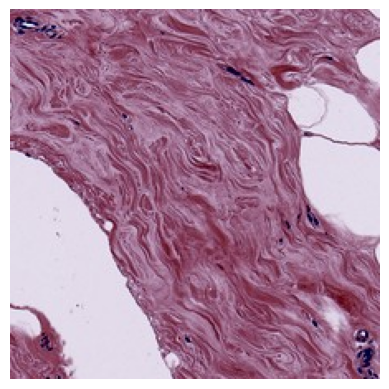

GTEX-U3ZN-1526_GTEX-U3ZN-1526_38_19.jpeg
leiden = 4


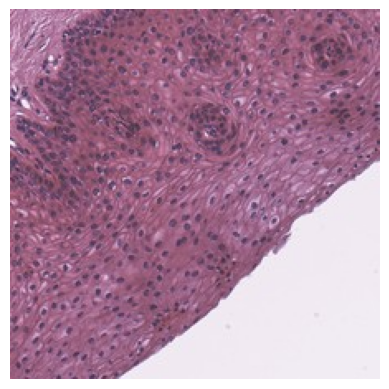

GTEX-T5JW-0726_GTEX-T5JW-0726_36_24.jpeg
leiden = 4


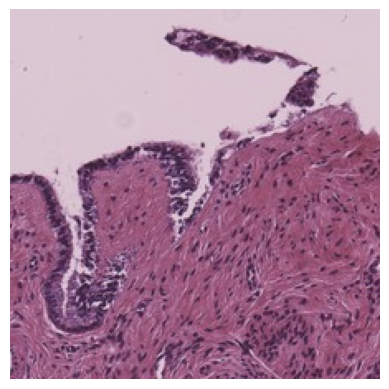

GTEX-145MF-2326_GTEX-145MF-2326_40_27.jpeg
leiden = 4


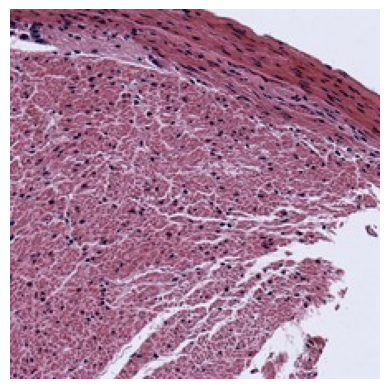

GTEX-11PRG-1926_GTEX-11PRG-1926_36_12.jpeg
leiden = 4


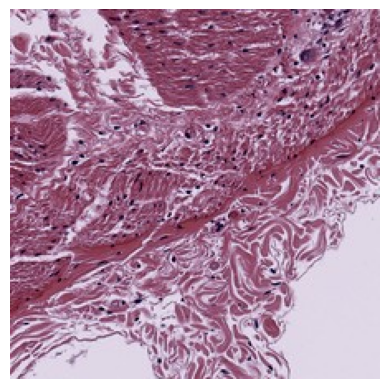

GTEX-ZV6S-0426_GTEX-ZV6S-0426_47_23.jpeg
leiden = 4


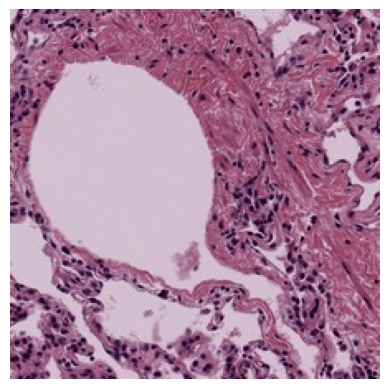

GTEX-11LCK-0426_GTEX-11LCK-0426_5_19.jpeg
leiden = 4


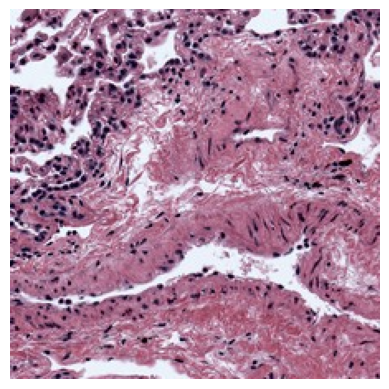

GTEX-13RTJ-2126_GTEX-13RTJ-2126_23_35.jpeg
leiden = 4


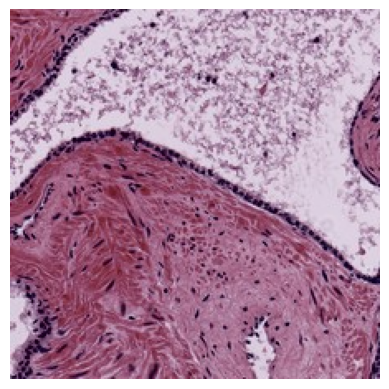

GTEX-111FC-2026_GTEX-111FC-2026_9_17.jpeg
leiden = 4


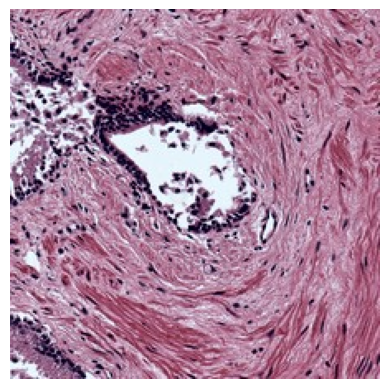

GTEX-11ZUS-0626_GTEX-11ZUS-0626_10_29.jpeg
leiden = 4


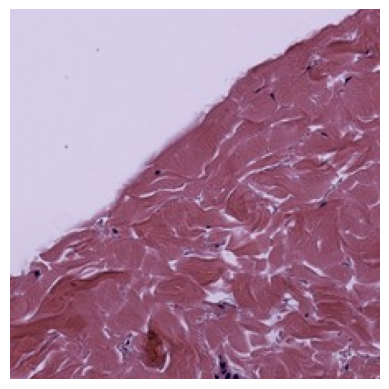

GTEX-145LU-0126_GTEX-145LU-0126_17_3.jpeg
leiden = 4


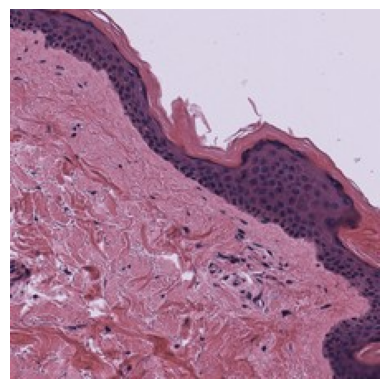

GTEX-13RTK-0226_GTEX-13RTK-0226_45_14.jpeg
leiden = 4


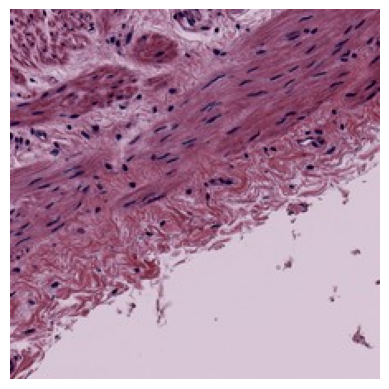

GTEX-1H1DF-2126_GTEX-1H1DF-2126_6_10.jpeg
leiden = 4


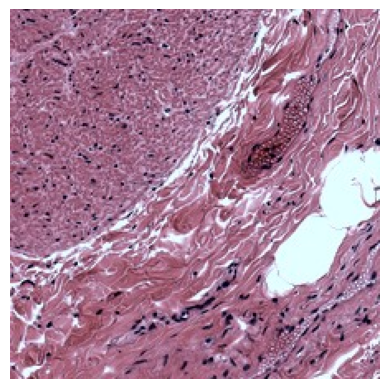

GTEX-1269C-2026_GTEX-1269C-2026_14_27.jpeg
leiden = 4


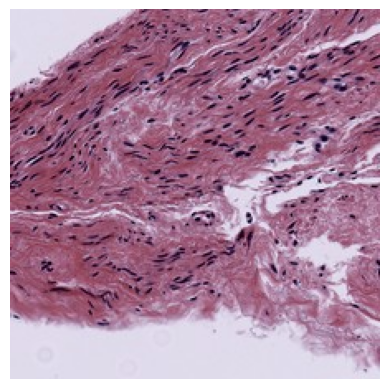

GTEX-18A7A-2926_GTEX-18A7A-2926_11_23.jpeg
leiden = 4


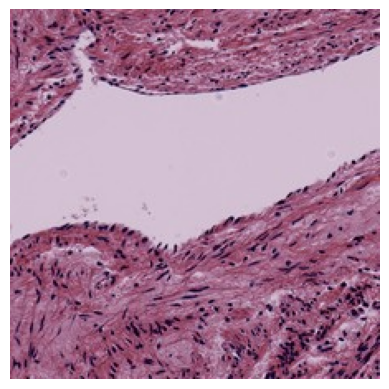

In [59]:
# a bunch of leiden 4s.

leiden4 = [
    "GTEX-QLQW-0826_GTEX-QLQW-0826_45_22.jpeg",     # Bladder
    "GTEX-OOBJ-1926_GTEX-OOBJ-1926_5_1.jpeg",      # Bladder
    "GTEX-11ZU8-1926_GTEX-11ZU8-1926_47_21.jpeg",   # Breast
    "GTEX-13OVJ-2226_GTEX-13OVJ-2226_23_25.jpeg",   # Breast
    "GTEX-U3ZN-1526_GTEX-U3ZN-1526_38_19.jpeg",     # Cervix
    "GTEX-T5JW-0726_GTEX-T5JW-0726_36_24.jpeg",     # Cervix
    "GTEX-145MF-2326_GTEX-145MF-2326_40_27.jpeg",   # Colon
    "GTEX-11PRG-1926_GTEX-11PRG-1926_36_12.jpeg",   # Colon
    "GTEX-ZV6S-0426_GTEX-ZV6S-0426_47_23.jpeg",     # Lung
    "GTEX-11LCK-0426_GTEX-11LCK-0426_5_19.jpeg",    # Lung
    "GTEX-13RTJ-2126_GTEX-13RTJ-2126_23_35.jpeg",   # Prostate
    "GTEX-111FC-2026_GTEX-111FC-2026_9_17.jpeg",    # Prostate
    "GTEX-11ZUS-0626_GTEX-11ZUS-0626_10_29.jpeg",   # Skin
    "GTEX-145LU-0126_GTEX-145LU-0126_17_3.jpeg",    # Skin
    "GTEX-13RTK-0226_GTEX-13RTK-0226_45_14.jpeg",   # Stomach
    "GTEX-1H1DF-2126_GTEX-1H1DF-2126_6_10.jpeg",    # Stomach
    "GTEX-1269C-2026_GTEX-1269C-2026_14_27.jpeg",   # Uterus, Corpi
    "GTEX-18A7A-2926_GTEX-18A7A-2926_11_23.jpeg"    # uterus, corpus
]

show_images_leiden(leiden4, 4)

GTEX-QLQW-0826_GTEX-QLQW-0826_14_27.jpeg
leiden = 1


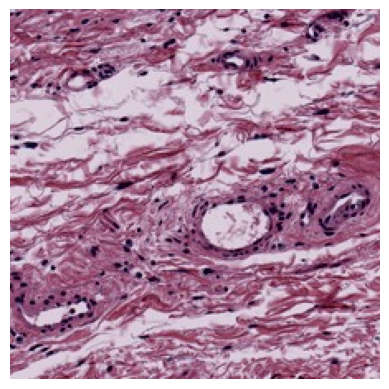

GTEX-N7MS-2126_GTEX-N7MS-2126_32_20.jpeg
leiden = 1


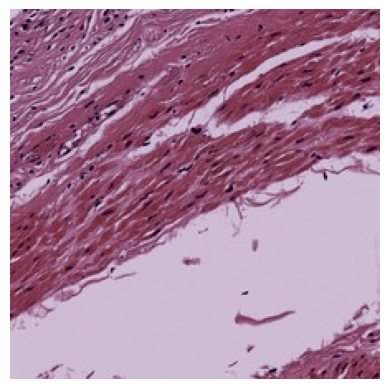

GTEX-PW2O-1026_GTEX-PW2O-1026_12_12.jpeg
leiden = 1


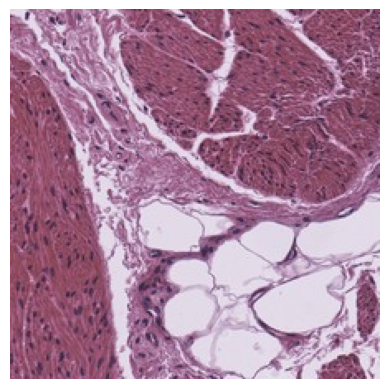

GTEX-14JFF-0826_GTEX-14JFF-0826_31_18.jpeg
leiden = 1


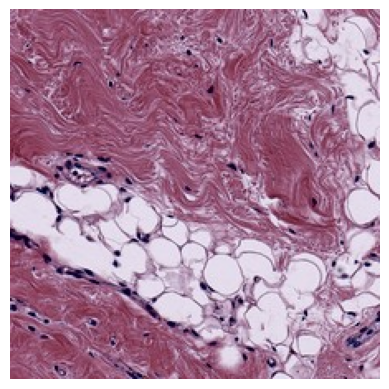

GTEX-13FH7-1826_GTEX-13FH7-1826_3_19.jpeg
leiden = 1


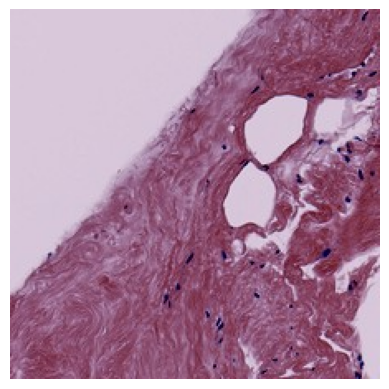

GTEX-14JFF-0826_GTEX-14JFF-0826_28_15.jpeg
leiden = 1


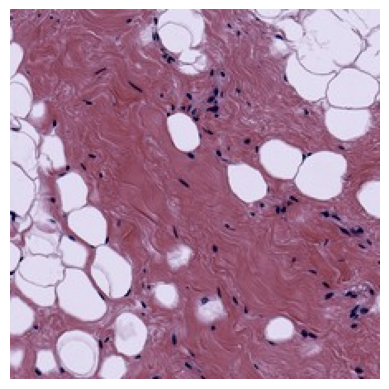

GTEX-11PRG-1926_GTEX-11PRG-1926_19_29.jpeg
leiden = 1


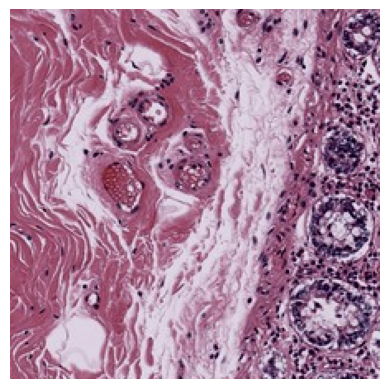

GTEX-1211K-1826_GTEX-1211K-1826_26_15.jpeg
leiden = 1


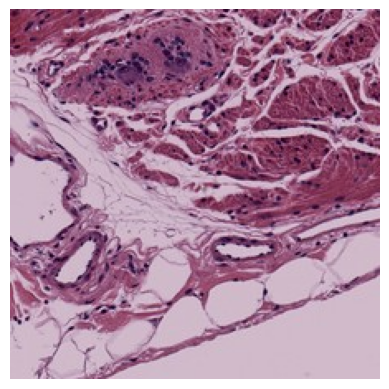

GTEX-111CU-1226_GTEX-111CU-1226_69_21.jpeg
leiden = 1


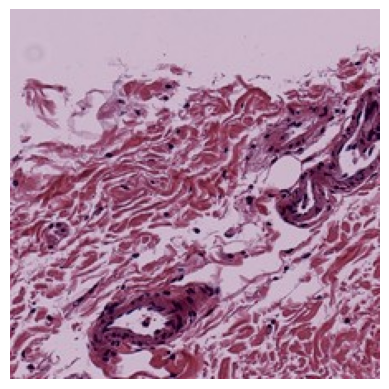

GTEX-15SHW-0226_GTEX-15SHW-0226_38_7.jpeg
leiden = 1


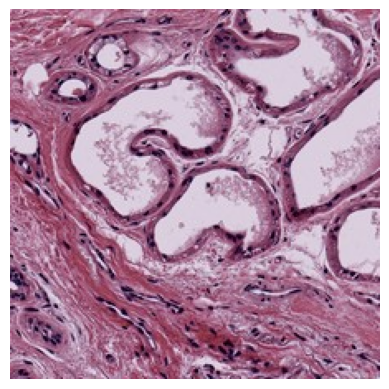

GTEX-1GZ4H-0526_GTEX-1GZ4H-0526_26_11.jpeg
leiden = 1


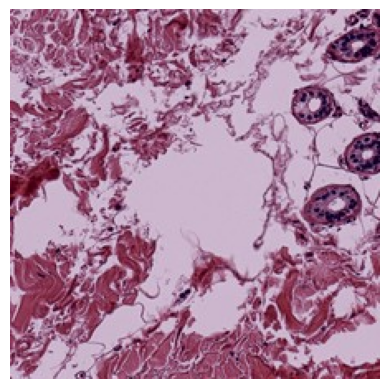

GTEX-1H1DF-1126_GTEX-1H1DF-1126_8_30.jpeg
leiden = 1


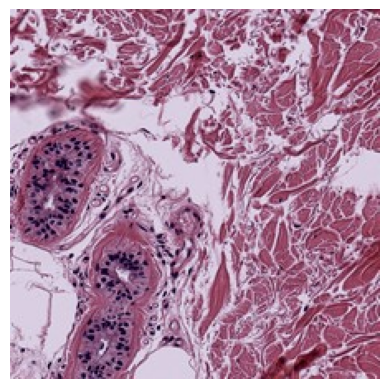

In [69]:
# a bunch of leiden 1s

leiden1 = ["GTEX-QLQW-0826_GTEX-QLQW-0826_14_27.jpeg",      # Bladder
           "GTEX-N7MS-2126_GTEX-N7MS-2126_32_20.jpeg",      # Bladder
           "GTEX-PW2O-1026_GTEX-PW2O-1026_12_12.jpeg",      # Bladder
           "GTEX-14JFF-0826_GTEX-14JFF-0826_31_18.jpeg",    # Breast
           "GTEX-13FH7-1826_GTEX-13FH7-1826_3_19.jpeg",     # Breast
           "GTEX-14JFF-0826_GTEX-14JFF-0826_28_15.jpeg",     # Breast
           "GTEX-11PRG-1926_GTEX-11PRG-1926_19_29.jpeg",    # Colon
           "GTEX-1211K-1826_GTEX-1211K-1826_26_15.jpeg",    # Colon
           "GTEX-111CU-1226_GTEX-111CU-1226_69_21.jpeg",    # Colon
           "GTEX-15SHW-0226_GTEX-15SHW-0226_38_7.jpeg",     # Skin
           "GTEX-1GZ4H-0526_GTEX-1GZ4H-0526_26_11.jpeg",    # Skin
           "GTEX-1H1DF-1126_GTEX-1H1DF-1126_8_30.jpeg",     # Skin
]

show_images_leiden(leiden1, 1)